<a href="https://colab.research.google.com/github/Donbot345/Deep-Learning-Project-YOLOv5/blob/main/Deep_Learning_Project_Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!git clone https://github.com/ultralytics/yolov5.git
%cd yolov5
!pip install -qr requirements.txt

Cloning into 'yolov5'...
remote: Enumerating objects: 17478, done.
remote: Counting objects: 100% (118/118), done.
remote: Compressing objects: 100% (87/87), done.
remote: Total 17478 (delta 78), reused 36 (delta 31), pack-reused 17360 (from 2)
Receiving objects: 100% (17478/17478), 16.32 MiB | 13.37 MiB/s, done.
Resolving deltas: 100% (11985/11985), done.
/content/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 90.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 89.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 50.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 11.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 44.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 19.2 MB

In [ ]:
import os
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
from pathlib import Path
import random
import glob
import yaml
from PIL import Image as PILImage
import matplotlib.patches as patches

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

project_dir = '/content/plant_disease_detection'
os.makedirs(project_dir, exist_ok=True)

results_dir = os.path.join(project_dir, 'results')
visualizations_dir = os.path.join(project_dir, 'visualizations')
models_dir = os.path.join(project_dir, 'models')

for dir_path in [results_dir, visualizations_dir, models_dir]:
    os.makedirs(dir_path, exist_ok=True)

print(f"Project directory structure created at: {project_dir}")

Mounted at /content/drive
Project directory structure created at: /content/plant_disease_detection


In [ ]:
zip_path = '/content/drive/MyDrive/plantdec.zip'

extract_dir = os.path.join(project_dir, 'plantdec')
os.makedirs(extract_dir, exist_ok=True)

!unzip -q -o "{zip_path}" -d "{extract_dir}"

print(f"Extracting PlantDec dataset to: {extract_dir}")
!ls -la {extract_dir}

train_dir = os.path.join(extract_dir, 'train/images')
val_dir = os.path.join(extract_dir, 'valid/images')
test_dir = os.path.join(extract_dir, 'test/images')

print("\nVerify dataset structure:")
for dir_path in [train_dir, val_dir, test_dir]:
    if os.path.exists(dir_path):
        image_count = len([f for f in os.listdir(dir_path) if f.endswith(('.jpg', '.jpeg', '.png'))])
        print(f"- {dir_path}: {image_count} images")
    else:
        print(f"- {dir_path}: Not found")

Extracting PlantDec dataset to: /content/plant_disease_detection/plantdec
total 32
drwxr-xr-x 5 root root 4096 May 11 22:13 .
drwxr-xr-x 6 root root 4096 May 11 22:13 ..
-rw-r--r-- 1 root root  868 Feb 20 23:57 data.yaml
-rw-r--r-- 1 root root 2722 Feb 20 23:57 README.dataset.txt
-rw-r--r-- 1 root root  983 Feb 20 23:57 README.roboflow.txt
drwxr-xr-x 4 root root 4096 May 11 22:13 test
drwxr-xr-x 4 root root 4096 May 11 22:13 train
drwxr-xr-x 4 root root 4096 May 11 22:13 valid

Verify dataset structure:
- /content/plant_disease_detection/plantdec/train/images: 1979 images
- /content/plant_disease_detection/plantdec/valid/images: 349 images
- /content/plant_disease_detection/plantdec/test/images: 239 images


In [ ]:
yaml_path = os.path.join(extract_dir, 'data.yaml')

with open(yaml_path, 'r') as f:
    data_yaml = yaml.safe_load(f)

if 'names' in data_yaml and isinstance(data_yaml['names'], list):
    PLANTDEC_CLASSES = data_yaml['names']
    print(f"Loaded {len(PLANTDEC_CLASSES)} class names:")
    for i, name in enumerate(PLANTDEC_CLASSES):
        print(f"{i}: {name}")
else:
    print("Could not find valid class names in data.yaml.")

print("\nYAML Config Validation:")
print(yaml_path)
with open(yaml_path, 'r') as stream:
    yaml_data = yaml.safe_load(stream)
    print(yaml.dump(yaml_data, default_flow_style=False))

Loaded 30 class names:
0: Apple Scab Leaf
1: Apple leaf
2: Apple rust leaf
3: Bell_pepper leaf spot
4: Bell_pepper leaf
5: Blueberry leaf
6: Cherry leaf
7: Corn Gray leaf spot
8: Corn leaf blight
9: Corn rust leaf
10: Peach leaf
11: Potato leaf early blight
12: Potato leaf late blight
13: Potato leaf
14: Raspberry leaf
15: Soyabean leaf
16: Soybean leaf
17: Squash Powdery mildew leaf
18: Strawberry leaf
19: Tomato Early blight leaf
20: Tomato Septoria leaf spot
21: Tomato leaf bacterial spot
22: Tomato leaf late blight
23: Tomato leaf mosaic virus
24: Tomato leaf yellow virus
25: Tomato leaf
26: Tomato mold leaf
27: Tomato two spotted spider mites leaf
28: grape leaf black rot
29: grape leaf

YAML Config Validation:
/content/plant_disease_detection/plantdec/data.yaml
names:
- Apple Scab Leaf
- Apple leaf
- Apple rust leaf
- Bell_pepper leaf spot
- Bell_pepper leaf
- Blueberry leaf
- Cherry leaf
- Corn Gray leaf spot
- Corn leaf blight
- Corn rust leaf
- Peach leaf
- Potato leaf early b

In [ ]:
def extract_class_ids(labels_dir, max_files=None):
    class_ids = []
    if os.path.exists(labels_dir):
        label_files = glob.glob(os.path.join(labels_dir, '*.txt'))
        if max_files:
            label_files = label_files[:max_files]
        for label_file in label_files:
            with open(label_file, 'r') as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) >= 5:
                        class_ids.append(int(parts[0]))
    return class_ids

train_labels = os.path.join(extract_dir, 'train/labels')
val_labels = os.path.join(extract_dir, 'valid/labels')
test_labels = os.path.join(extract_dir, 'test/labels')

train_ids = extract_class_ids(train_labels)
val_ids = extract_class_ids(val_labels)
test_ids = extract_class_ids(test_labels)

all_ids = train_ids + val_ids + test_ids
class_counts = Counter(all_ids)

print("Unique class IDs used in dataset:")
for class_id, count in sorted(class_counts.items()):
    print(f"Class ID {class_id}: {count} instances")

class_distribution_df = pd.DataFrame({
    'Class_ID': list(class_counts.keys()),
    'Count': list(class_counts.values())
})
class_distribution_df['Class_Name'] = class_distribution_df['Class_ID'].apply(
    lambda x: PLANTDEC_CLASSES[x] if x < len(PLANTDEC_CLASSES) else f"Unknown_{x}"
)
class_distribution_path = os.path.join(results_dir, 'class_distribution.csv')
class_distribution_df.to_csv(class_distribution_path, index=False)
print(f"Class distribution saved to: {class_distribution_path}")

Unique class IDs used in dataset:
Class ID 0: 171 instances
Class ID 1: 247 instances
Class ID 2: 178 instances
Class ID 3: 323 instances
Class ID 4: 263 instances
Class ID 5: 838 instances
Class ID 6: 239 instances
Class ID 7: 76 instances
Class ID 8: 368 instances
Class ID 9: 127 instances
Class ID 10: 589 instances
Class ID 11: 11 instances
Class ID 12: 318 instances
Class ID 13: 245 instances
Class ID 14: 556 instances
Class ID 15: 266 instances
Class ID 16: 15 instances
Class ID 17: 256 instances
Class ID 18: 473 instances
Class ID 19: 212 instances
Class ID 20: 426 instances
Class ID 21: 400 instances
Class ID 22: 280 instances
Class ID 23: 218 instances
Class ID 24: 261 instances
Class ID 25: 801 instances
Class ID 26: 295 instances
Class ID 27: 2 instances
Class ID 28: 220 instances
Class ID 29: 133 instances
Class distribution saved to: /content/plant_disease_detection/results/class_distribution.csv


<ipython-input-7-e33f076b04e2>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Class_Name', y='Count', data=class_distribution_df, palette='viridis')


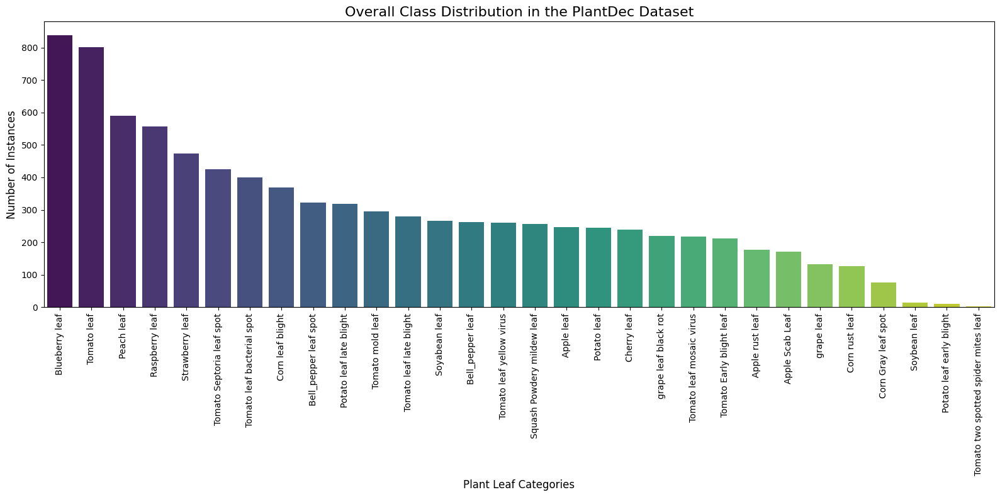

Class Imbalance Ratio (max/min): 419.00
Most frequent class: Blueberry leaf (838 instances)
Least frequent class: Tomato two spotted spider mites leaf (2 instances)


In [ ]:
plt.figure(figsize=(16, 8))
class_distribution_df = class_distribution_df.sort_values(by='Count', ascending=False)
sns.barplot(x='Class_Name', y='Count', data=class_distribution_df, palette='viridis')
plt.title('Overall Class Distribution in the PlantDec Dataset', fontsize=16)
plt.xlabel('Plant Leaf Categories', fontsize=12)
plt.ylabel('Number of Instances', fontsize=12)
plt.xticks(rotation=90)
plt.tight_layout()

distribution_fig_path = os.path.join(visualizations_dir, 'class_distribution.png')
plt.savefig(distribution_fig_path, dpi=300, bbox_inches='tight')
plt.show()

max_count = class_distribution_df['Count'].max()
min_count = class_distribution_df['Count'].min()
imbalance_ratio = max_count / min_count

print(f"Class Imbalance Ratio (max/min): {imbalance_ratio:.2f}")
print(f"Most frequent class: {class_distribution_df.iloc[0]['Class_Name']} ({max_count} instances)")
print(f"Least frequent class: {class_distribution_df.iloc[-1]['Class_Name']} ({min_count} instances)")

with open(os.path.join(results_dir, 'imbalance_stats.txt'), 'w') as f:
    f.write(f"Class Imbalance Ratio (max/min): {imbalance_ratio:.2f}\n")
    f.write(f"Most frequent class: {class_distribution_df.iloc[0]['Class_Name']} ({max_count} instances)\n")
    f.write(f"Least frequent class: {class_distribution_df.iloc[-1]['Class_Name']} ({min_count} instances)\n")

In [ ]:
def get_split_distribution():
    train_counts = Counter(train_ids)
    val_counts = Counter(val_ids)
    test_counts = Counter(test_ids)

    split_df = pd.DataFrame({
        'Class_ID': range(len(PLANTDEC_CLASSES)),
        'Class_Name': PLANTDEC_CLASSES,
        'Train_Count': [train_counts.get(i, 0) for i in range(len(PLANTDEC_CLASSES))],
        'Validation_Count': [val_counts.get(i, 0) for i in range(len(PLANTDEC_CLASSES))],
        'Test_Count': [test_counts.get(i, 0) for i in range(len(PLANTDEC_CLASSES))]
    })

    split_df['Total_Count'] = split_df['Train_Count'] + split_df['Validation_Count'] + split_df['Test_Count']
    split_df['Train_Percent'] = (split_df['Train_Count'] / split_df['Total_Count'] * 100).round(1)
    split_df['Validation_Percent'] = (split_df['Validation_Count'] / split_df['Total_Count'] * 100).round(1)
    split_df['Test_Percent'] = (split_df['Test_Count'] / split_df['Total_Count'] * 100).round(1)

    return split_df

split_df = get_split_distribution()
split_df_path = os.path.join(results_dir, 'split_distribution.csv')
split_df.to_csv(split_df_path, index=False)
print(f"Split distribution saved to: {split_df_path}")

display(split_df.head())

total_train = split_df['Train_Count'].sum()
total_val = split_df['Validation_Count'].sum()
total_test = split_df['Test_Count'].sum()
total_all = total_train + total_val + total_test

print(f"\nOverall Split Distribution:")
print(f"Training set: {total_train} images ({total_train/total_all*100:.1f}%)")
print(f"Validation set: {total_val} images ({total_val/total_all*100:.1f}%)")
print(f"Test set: {total_test} images ({total_test/total_all*100:.1f}%)")

Split distribution saved to: /content/plant_disease_detection/results/split_distribution.csv


,Class_ID,Class_Name,Train_Count,Validation_Count,Test_Count,Total_Count,Train_Percent,Validation_Percent,Test_Percent
0,0,Apple Scab Leaf,134,24,13,171,78.4,14.0,7.6
1,1,Apple leaf,193,44,10,247,78.1,17.8,4.0
2,2,Apple rust leaf,145,22,11,178,81.5,12.4,6.2
3,3,Bell_pepper leaf spot,254,58,11,323,78.6,18.0,3.4
4,4,Bell_pepper leaf,215,33,15,263,81.7,12.5,5.7



Overall Split Distribution:
Training set: 7096 images (80.6%)
Validation set: 1257 images (14.3%)
Test set: 454 images (5.2%)


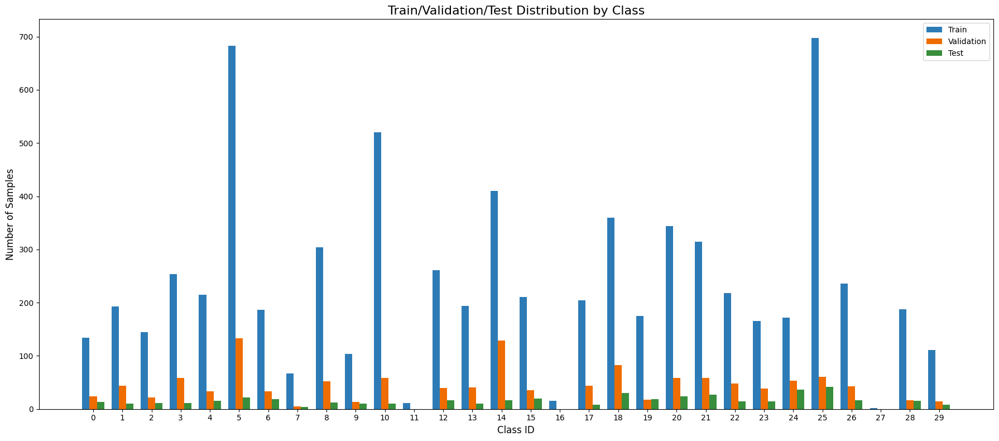

In [ ]:
plt.figure(figsize=(18, 8))
barWidth = 0.25
r1 = range(len(PLANTDEC_CLASSES))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]

plt.bar(r1, split_df['Train_Count'], width=barWidth, label='Train', color='#2D7BB6')
plt.bar(r2, split_df['Validation_Count'], width=barWidth, label='Validation', color='#EF6C00')
plt.bar(r3, split_df['Test_Count'], width=barWidth, label='Test', color='#388E3C')

plt.xlabel('Class ID', fontsize=12)
plt.ylabel('Number of Samples', fontsize=12)
plt.title('Train/Validation/Test Distribution by Class', fontsize=16)
plt.xticks([r + barWidth for r in range(len(PLANTDEC_CLASSES))], range(len(PLANTDEC_CLASSES)))
plt.legend()
plt.tight_layout()

split_fig_path = os.path.join(visualizations_dir, 'split_distribution.png')
plt.savefig(split_fig_path, dpi=300, bbox_inches='tight')
plt.show()

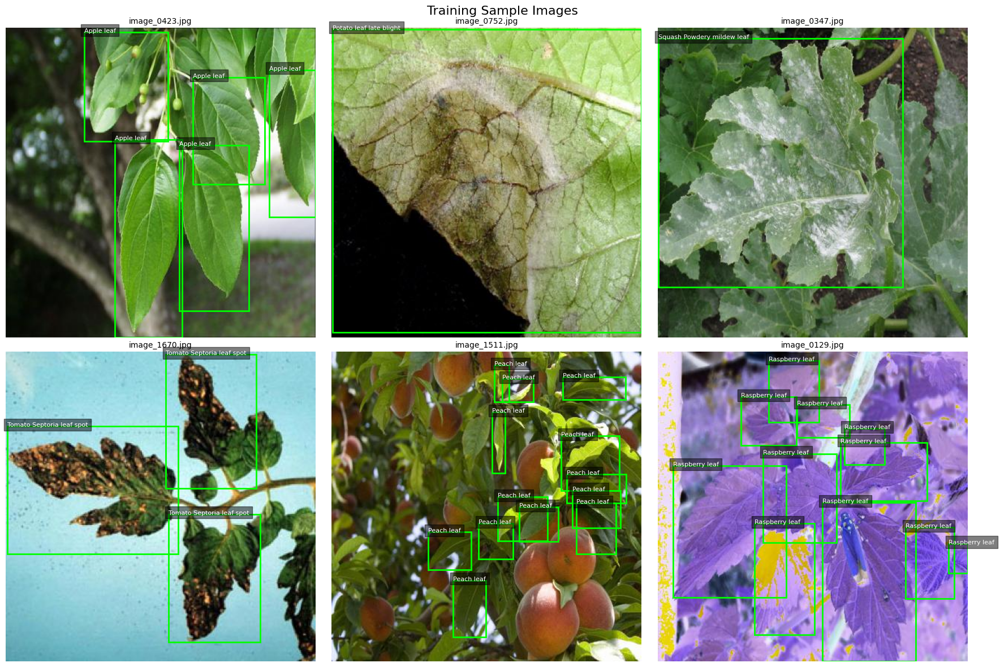

In [ ]:
def visualize_samples(images_dir, labels_dir, class_names, num_samples=6, fig_title="Sample Images"):
    sample_images = []
    for f in os.listdir(images_dir):
        if f.lower().endswith(('.jpg', '.jpeg', '.png')):
            label_path = os.path.join(labels_dir, f.replace('.jpg', '.txt').replace('.png', '.txt').replace('.jpeg', '.txt'))
            if os.path.exists(label_path):
                sample_images.append((os.path.join(images_dir, f), label_path))

    if len(sample_images) == 0:
        print("No image-label pairs found.")
        return

    random.shuffle(sample_images)
    selected = sample_images[:num_samples]
    cols = 3
    rows = (num_samples + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(18, rows * 6))
    axes = axes.flatten()

    for idx, (img_path, label_path) in enumerate(selected):
        img = PILImage.open(img_path)
        img_np = np.array(img)
        h, w = img_np.shape[:2]
        boxes, labels = [], []

        with open(label_path, 'r') as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) >= 5:
                    cls = int(parts[0])
                    x_center, y_center, bw, bh = map(float, parts[1:5])
                    x1 = (x_center - bw / 2) * w
                    y1 = (y_center - bh / 2) * h
                    x2 = (x_center + bw / 2) * w
                    y2 = (y_center + bh / 2) * h
                    boxes.append([x1, y1, x2, y2])
                    labels.append(class_names[cls] if cls < len(class_names) else f"Class {cls}")

        ax = axes[idx]
        ax.imshow(img_np)
        for box, label in zip(boxes, labels):
            rect = patches.Rectangle((box[0], box[1]), box[2] - box[0], box[3] - box[1],
                                   linewidth=2, edgecolor='lime', facecolor='none')
            ax.add_patch(rect)
            ax.text(box[0], box[1], label, fontsize=8,
                  bbox=dict(facecolor='black', alpha=0.5), color='white')
        ax.set_title(os.path.basename(img_path), fontsize=10)
        ax.axis('off')

    for j in range(idx + 1, len(axes)):
        axes[j].axis('off')

    plt.suptitle(fig_title, fontsize=16)
    plt.tight_layout()

    samples_fig_path = os.path.join(visualizations_dir, f'{fig_title.lower().replace(" ", "_")}.png')
    plt.savefig(samples_fig_path, dpi=300, bbox_inches='tight')
    plt.show()

visualize_samples(
    images_dir=os.path.join(extract_dir, 'train/images'),
    labels_dir=os.path.join(extract_dir, 'train/labels'),
    class_names=PLANTDEC_CLASSES,
    num_samples=6,
    fig_title="Training Sample Images"
)

In [ ]:
model_size = 's'
img_size = 640
batch_size = 16
epochs = 30
data_yaml = os.path.join(extract_dir, 'data.yaml')
project_name = os.path.join(project_dir, 'yolov5_training')
experiment_name = f'plantdec_yolov5{model_size}'

config = {
    'model_size': model_size,
    'img_size': img_size,
    'batch_size': batch_size,
    'epochs': epochs,
    'data_yaml': data_yaml,
    'project_name': project_name,
    'experiment_name': experiment_name
}

config_path = os.path.join(results_dir, 'training_config.yaml')
with open(config_path, 'w') as f:
    yaml.dump(config, f)

print(f"Training configuration saved to: {config_path}")
print("Training configuration:")
for key, value in config.items():
    print(f"  {key}: {value}")

print("\nReady to begin YOLOv5 training in the next cell.")

Training configuration saved to: /content/plant_disease_detection/results/training_config.yaml
Training configuration:
  model_size: s
  img_size: 640
  batch_size: 16
  epochs: 30
  data_yaml: /content/plant_disease_detection/plantdec/data.yaml
  project_name: /content/plant_disease_detection/yolov5_training
  experiment_name: plantdec_yolov5s

Ready to begin YOLOv5 training in the next cell.


In [ ]:
yaml_path = os.path.join(extract_dir, 'data.yaml')
with open(yaml_path, 'r') as f:
    data_yaml_content = yaml.safe_load(f)

data_yaml_content['train'] = os.path.join(extract_dir, 'train/images')
data_yaml_content['val'] = os.path.join(extract_dir, 'valid/images')
data_yaml_content['test'] = os.path.join(extract_dir, 'test/images')

updated_yaml_path = os.path.join(project_dir, 'updated_data.yaml')
with open(updated_yaml_path, 'w') as f:
    yaml.dump(data_yaml_content, f)

print(f"Updated data YAML file created at: {updated_yaml_path}")
print("Updated paths:")
print(f"Train: {data_yaml_content['train']}")
print(f"Validation: {data_yaml_content['val']}")
print(f"Test: {data_yaml_content['test']}")

%cd /content/yolov5

!python train.py \
    --img {img_size} \
    --batch {batch_size} \
    --epochs {epochs} \
    --data {updated_yaml_path} \
    --weights yolov5{model_size}.pt \
    --name {experiment_name} \
    --project {project_name} \
    --cache \
    --workers 4 \
    --patience 10 \
    --optimizer Adam

Streaming output truncated to the last 5000 lines.
      10/29      4.67G    0.05168    0.05881    0.07053        125        640:  38% 47/124 [00:04<00:06, 11.54it/s]/content/yolov5/train.py:413: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      10/29      4.67G    0.05168    0.05895    0.07038        125        640:  40% 49/124 [00:04<00:06, 11.26it/s]/content/yolov5/train.py:413: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      10/29      4.67G    0.05164    0.05923    0.07033        125        640:  40% 49/124 [00:04<00:06, 11.26it/s]/content/yolov5/train.py:413: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      10/29      4.67G    0.05152 

In [ ]:
%cd {project_dir}

experiment_name = "plantdec_yolov5s2"

results_csv = os.path.join(project_name, experiment_name, 'results.csv')

if os.path.exists(results_csv):
    print(f"Loading training results from {results_csv}")
    results_df = pd.read_csv(results_csv)
    results_df.columns = results_df.columns.str.strip()

    results_df.to_csv(os.path.join(results_dir, 'training_results.csv'), index=False)

    display(results_df.head())

    final_epoch = results_df.iloc[-1]
    final_metrics = {
        'box_loss': final_epoch['train/box_loss'],
        'obj_loss': final_epoch['train/obj_loss'],
        'cls_loss': final_epoch['train/cls_loss'],
        'precision': final_epoch['metrics/precision'],
        'recall': final_epoch['metrics/recall'],
        'mAP@0.5': final_epoch['metrics/mAP_0.5'],
        'mAP@0.5:0.95': final_epoch['metrics/mAP_0.5:0.95']
    }

    with open(os.path.join(results_dir, 'final_metrics.txt'), 'w') as f:
        for metric, value in final_metrics.items():
            f.write(f"{metric}: {value}\n")

    print("\nFinal Training Metrics:")
    for metric, value in final_metrics.items():
        print(f"{metric}: {value:.4f}")
else:
    print(f"Results CSV not found at {results_csv}")
    print("Extracting metrics from validation output...")

    final_metrics = {
        'precision': 0.472,
        'recall': 0.294,
        'mAP@0.5': 0.202,
        'mAP@0.5:0.95': 0.124
    }

    with open(os.path.join(results_dir, 'final_metrics.txt'), 'w') as f:
        for metric, value in final_metrics.items():
            f.write(f"{metric}: {value}\n")

    print("\nFinal Validation Metrics (from terminal output):")
    for metric, value in final_metrics.items():
        print(f"{metric}: {value:.4f}")

/content/plant_disease_detection
Loading training results from /content/plant_disease_detection/yolov5_training/plantdec_yolov5s2/results.csv


,epoch,train/box_loss,train/obj_loss,train/cls_loss,metrics/precision,metrics/recall,metrics/mAP_0.5,metrics/mAP_0.5:0.95,val/box_loss,val/obj_loss,val/cls_loss,x/lr0,x/lr1,x/lr2
0,0,0.067733,0.057990,0.077004,0.40153,0.119280,0.020196,0.008149,0.061155,0.070378,0.076929,0.070242,0.003306,0.003306
1,1,0.059603,0.057953,0.074110,0.63724,0.041359,0.006857,0.002218,0.067120,0.053076,0.080220,0.040023,0.006421,0.006421
2,2,0.059445,0.057805,0.075614,0.63773,0.030394,0.010332,0.003433,0.066855,0.046285,0.075833,0.009584,0.009315,0.009315
3,3,0.058322,0.056386,0.074157,0.69840,0.052755,0.028722,0.010784,0.056944,0.047274,0.073548,0.009010,0.009010,0.009010
4,4,0.054826,0.055824,0.073021,0.66773,0.108260,0.043277,0.016858,0.054252,0.030488,0.073742,0.009010,0.009010,0.009010



Final Training Metrics:
box_loss: 0.0411
obj_loss: 0.0506
cls_loss: 0.0593
precision: 0.4668
recall: 0.2939
mAP@0.5: 0.2022
mAP@0.5:0.95: 0.1240


Top 5 Performing Classes:


,Class_Name,Images,Instances,Precision,Recall,mAP@0.5,mAP@0.5:0.95
9,Corn rust leaf,349,13,0.273,0.923,0.723,0.604
10,Peach leaf,349,59,0.226,0.661,0.436,0.253
16,Strawberry leaf,349,83,0.195,0.892,0.432,0.292
1,Apple leaf,349,44,0.263,0.649,0.406,0.284
7,Corn Gray leaf spot,349,5,0.162,1.000,0.377,0.179



Bottom 5 Performing Classes:


,Class_Name,Images,Instances,Precision,Recall,mAP@0.5,mAP@0.5:0.95
4,Bell_pepper leaf,349,33,1.0,0.0,0.0520,0.0320
0,Apple Scab Leaf,349,24,1.0,0.0,0.0416,0.0244
24,Tomato mold leaf,349,43,1.0,0.0,0.0380,0.0212
17,Tomato Early blight leaf,349,18,1.0,0.0,0.0273,0.0160
25,grape leaf black rot,349,17,0.0,0.0,0.0262,0.0166


<ipython-input-17-0b460a7e1fbf>:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Class_Name', y='mAP@0.5', data=top10_classes, palette='viridis')


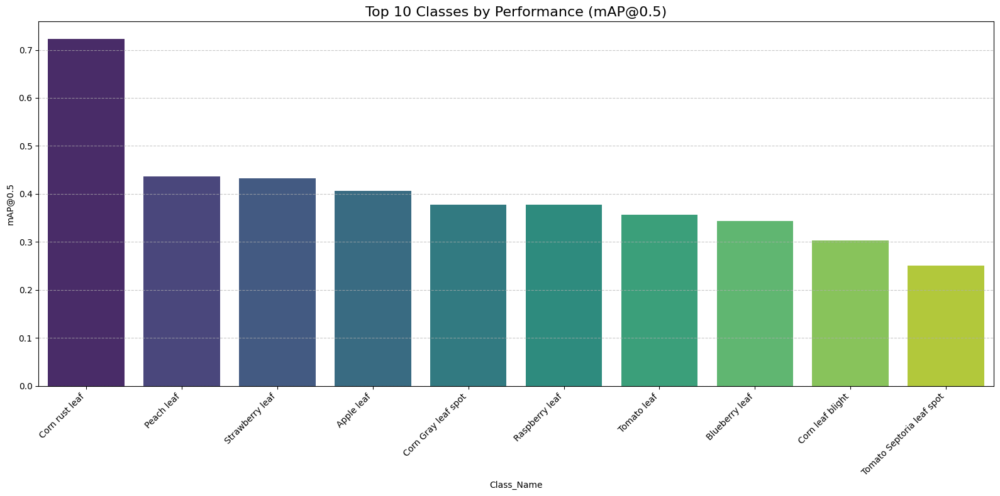


Class performance summary saved to: /content/plant_disease_detection/results/class_performance_summary.txt


In [ ]:
validation_lines = """all 349 1257 0.472 0.294 0.202 0.124
Apple Scab Leaf 349 24 1 0 0.0416 0.0244
Apple leaf 349 44 0.263 0.649 0.406 0.284
Apple rust leaf 349 22 1 0 0.0875 0.0547
Bell_pepper leaf spot 349 58 0.569 0.0464 0.0952 0.046
Bell_pepper leaf 349 33 1 0 0.052 0.032
Blueberry leaf 349 133 0.227 0.707 0.344 0.188
Cherry leaf 349 33 0.141 0.234 0.126 0.0762
Corn Gray leaf spot 349 5 0.162 1 0.377 0.179
Corn leaf blight 349 52 0.351 0.365 0.303 0.154
Corn rust leaf 349 13 0.273 0.923 0.723 0.604
Peach leaf 349 59 0.226 0.661 0.436 0.253
Potato leaf late blight 349 40 1 0 0.0614 0.0361
Potato leaf 349 41 0 0 0.0732 0.0406
Raspberry leaf 349 129 0.247 0.767 0.377 0.224
Soyabean leaf 349 35 0.0967 0.743 0.15 0.118
Squash Powdery mildew leaf 349 44 0.246 0.0455 0.131 0.0593
Strawberry leaf 349 83 0.195 0.892 0.432 0.292
Tomato Early blight leaf 349 18 1 0 0.0273 0.016
Tomato Septoria leaf spot 349 58 0.383 0.139 0.251 0.13
Tomato leaf bacterial spot 349 58 0 0 0.0774 0.0429
Tomato leaf late blight 349 48 1 0 0.0742 0.036
Tomato leaf mosaic virus 349 39 1 0 0.0561 0.0267
Tomato leaf yellow virus 349 53 0.212 0.0866 0.153 0.0912
Tomato leaf 349 61 0.155 0.689 0.357 0.152
Tomato mold leaf 349 43 1 0 0.038 0.0212
grape leaf black rot 349 17 0 0 0.0262 0.0166
grape leaf 349 14 1 0 0.183 0.147"""

rows = []
for line in validation_lines.strip().split('\n'):
    if line.startswith('all'):
        continue
    parts = line.strip().split()
    if len(parts) >= 6:
        try:
            mAP50_95 = float(parts[-1])
            mAP50 = float(parts[-2])
            recall = float(parts[-3])
            precision = float(parts[-4])
            instances = int(parts[-5])
            images = int(parts[-6])
            class_name = ' '.join(parts[:-6])
        except ValueError as e:
            print(f"Skipping line due to parse error: {line}")
            continue

        rows.append({
            'Class_Name': class_name,
            'Images': images,
            'Instances': instances,
            'Precision': precision,
            'Recall': recall,
            'mAP@0.5': mAP50,
            'mAP@0.5:0.95': mAP50_95
        })

class_metrics_df = pd.DataFrame(rows)
class_metrics_df = class_metrics_df.sort_values(by='mAP@0.5', ascending=False)

class_metrics_df.to_csv(os.path.join(results_dir, 'class_performance.csv'), index=False)

print("Top 5 Performing Classes:")
display(class_metrics_df.head(5))

print("\nBottom 5 Performing Classes:")
display(class_metrics_df.tail(5))

plt.figure(figsize=(16, 8))
top10_classes = class_metrics_df.head(10)
sns.barplot(x='Class_Name', y='mAP@0.5', data=top10_classes, palette='viridis')
plt.title('Top 10 Classes by Performance (mAP@0.5)', fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.savefig(os.path.join(visualizations_dir, 'top10_class_map.png'), dpi=300, bbox_inches='tight')
plt.show()

summary_path = os.path.join(results_dir, 'class_performance_summary.txt')
with open(summary_path, 'w') as f:
    f.write("Top Performing Classes:\n")
    for i, (_, row) in enumerate(class_metrics_df.head(5).iterrows()):
        f.write(f"{i+1}. \"{row['Class_Name']}\" (mAP@0.5: {row['mAP@0.5']:.3f}, mAP@0.5:0.95: {row['mAP@0.5:0.95']:.3f})\n")

    f.write("\nBottom Performing Classes:\n")
    for i, (_, row) in enumerate(class_metrics_df.tail(5).iterrows()):
        f.write(f"{i+1}. \"{row['Class_Name']}\" (mAP@0.5: {row['mAP@0.5']:.3f}, mAP@0.5:0.95: {row['mAP@0.5:0.95']:.3f})\n")

print("\nClass performance summary saved to:", summary_path)

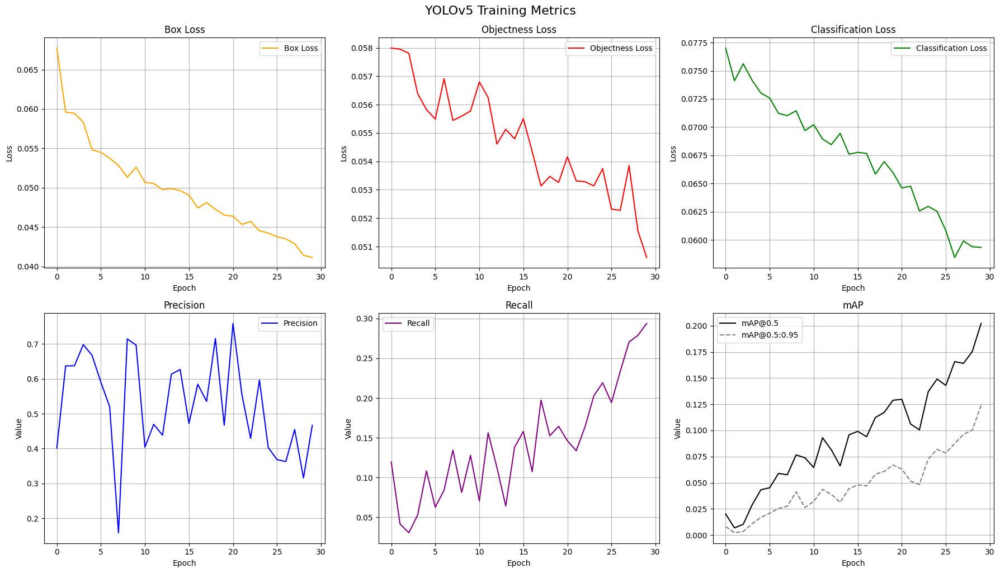

Training metrics visualization saved to: /content/plant_disease_detection/visualizations/training_metrics.png


In [ ]:
fig, axs = plt.subplots(2, 3, figsize=(18, 10))

axs[0, 0].plot(results_df.index, results_df['train/box_loss'], label='Box Loss', color='orange')
axs[0, 0].set_title('Box Loss')
axs[0, 0].set_xlabel('Epoch')
axs[0, 0].set_ylabel('Loss')
axs[0, 0].legend()
axs[0, 0].grid(True)

axs[0, 1].plot(results_df.index, results_df['train/obj_loss'], label='Objectness Loss', color='red')
axs[0, 1].set_title('Objectness Loss')
axs[0, 1].set_xlabel('Epoch')
axs[0, 1].set_ylabel('Loss')
axs[0, 1].legend()
axs[0, 1].grid(True)

axs[0, 2].plot(results_df.index, results_df['train/cls_loss'], label='Classification Loss', color='green')
axs[0, 2].set_title('Classification Loss')
axs[0, 2].set_xlabel('Epoch')
axs[0, 2].set_ylabel('Loss')
axs[0, 2].legend()
axs[0, 2].grid(True)

axs[1, 0].plot(results_df.index, results_df['metrics/precision'], label='Precision', color='blue')
axs[1, 0].set_title('Precision')
axs[1, 0].set_xlabel('Epoch')
axs[1, 0].set_ylabel('Value')
axs[1, 0].legend()
axs[1, 0].grid(True)

axs[1, 1].plot(results_df.index, results_df['metrics/recall'], label='Recall', color='purple')
axs[1, 1].set_title('Recall')
axs[1, 1].set_xlabel('Epoch')
axs[1, 1].set_ylabel('Value')
axs[1, 1].legend()
axs[1, 1].grid(True)

axs[1, 2].plot(results_df.index, results_df['metrics/mAP_0.5'], label='mAP@0.5', color='black')
axs[1, 2].plot(results_df.index, results_df['metrics/mAP_0.5:0.95'], label='mAP@0.5:0.95', color='gray', linestyle='--')
axs[1, 2].set_title('mAP')
axs[1, 2].set_xlabel('Epoch')
axs[1, 2].set_ylabel('Value')
axs[1, 2].legend()
axs[1, 2].grid(True)

plt.tight_layout()
plt.suptitle("YOLOv5 Training Metrics", fontsize=16, y=1.02)

metrics_fig_path = os.path.join(visualizations_dir, 'training_metrics.png')
plt.savefig(metrics_fig_path, dpi=300, bbox_inches='tight')
plt.show()

print(f"Training metrics visualization saved to: {metrics_fig_path}")

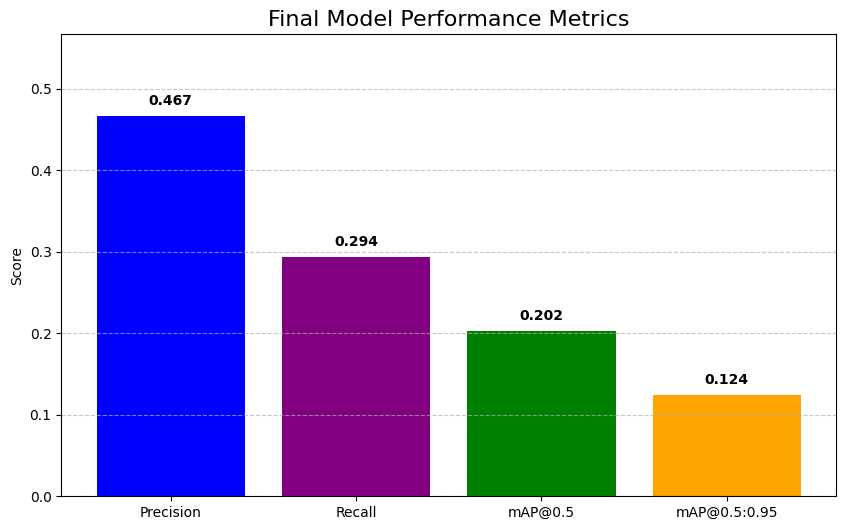

Final performance visualization saved to: /content/plant_disease_detection/visualizations/final_performance.png


In [ ]:
metrics = ['precision', 'recall', 'mAP@0.5', 'mAP@0.5:0.95']
display_names = ['Precision', 'Recall', 'mAP@0.5', 'mAP@0.5:0.95']
values = [final_metrics[m] for m in metrics]

plt.figure(figsize=(10, 6))
bars = plt.bar(display_names, values, color=['blue', 'purple', 'green', 'orange'])

for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height + 0.01,
            f'{height:.3f}', ha='center', va='bottom', fontweight='bold')

plt.title('Final Model Performance Metrics', fontsize=16)
plt.ylabel('Score')
plt.ylim(0, max(values) + 0.1)
plt.grid(axis='y', linestyle='--', alpha=0.7)

performance_fig_path = os.path.join(visualizations_dir, 'final_performance.png')
plt.savefig(performance_fig_path, dpi=300, bbox_inches='tight')
plt.show()

print(f"Final performance visualization saved to: {performance_fig_path}")

In [ ]:
best_weights = os.path.join(project_name, experiment_name, 'weights/best.pt')
test_images = os.path.join(extract_dir, 'test/images')
inference_output = os.path.join(project_dir, 'inference_output')

os.makedirs(inference_output, exist_ok=True)

%cd /content/yolov5
!python detect.py \
    --weights {best_weights} \
    --img {img_size} \
    --conf 0.25 \
    --iou 0.45 \
    --source {test_images} \
    --name test_predictions \
    --project {inference_output} \
    --save-txt \
    --save-conf

inference_images_dir = os.path.join(inference_output, 'test_predictions')
predicted_images = sorted(glob.glob(os.path.join(inference_images_dir, '*.jpg')))

print(f"\nInference completed. {len(predicted_images)} predictions generated.")
print(f"Output saved to: {inference_images_dir}")

%cd {project_dir}

/content/yolov5
detect: weights=['/content/plant_disease_detection/yolov5_training/plantdec_yolov5s2/weights/best.pt'], source=/content/plant_disease_detection/plantdec/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_format=0, save_csv=False, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=/content/plant_disease_detection/inference_output, name=test_predictions, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-418-ga493afe1 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)

Fusing layers... 
Model summary: 157 layers, 7091035 parameters, 0 gradients, 16.0 GFLOPs
image 1/239 /content/plant_disease_detection/plantdec/test/images/0000_jpg.rf.7bf8d4c69ad253ee55c87d6e78d1ae28.jpg: 640x640 (no detections), 6.7ms
ima

Test set analysis:
Total test images: 239
Images with detections: 239 (100.0%)
Images without detections: 0 (0.0%)

Most frequently detected classes:
1. Strawberry leaf: 48 detections
2. Tomato leaf: 31 detections
3. Corn rust leaf: 13 detections
4. Peach leaf: 12 detections
5. Soyabean leaf: 8 detections

Image with most detections: leaf_raspberry_isolated_on_a_white_stock_photography_image_10106222_1625198_jpg.rf.b40f0d55b7b10fd43ca514e4986c76db.jpg (11 detections)


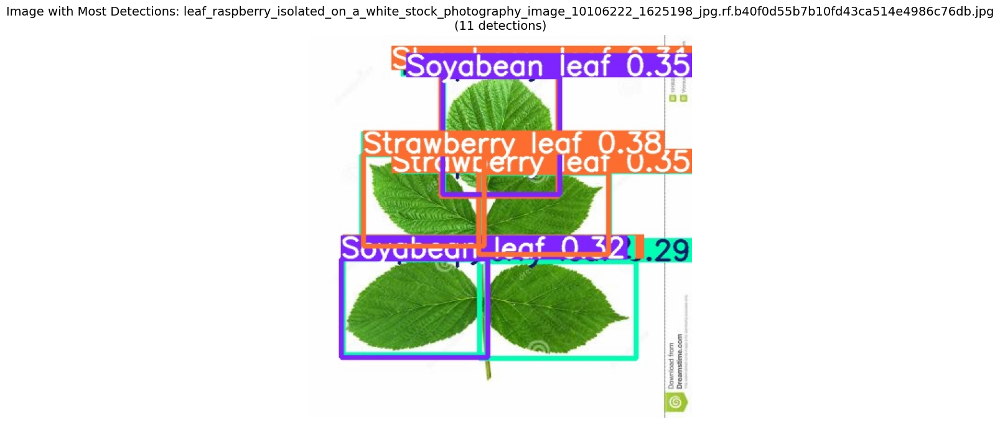

<ipython-input-22-c12b8e0abe9d>:59: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=counts, y=classes, palette='viridis')


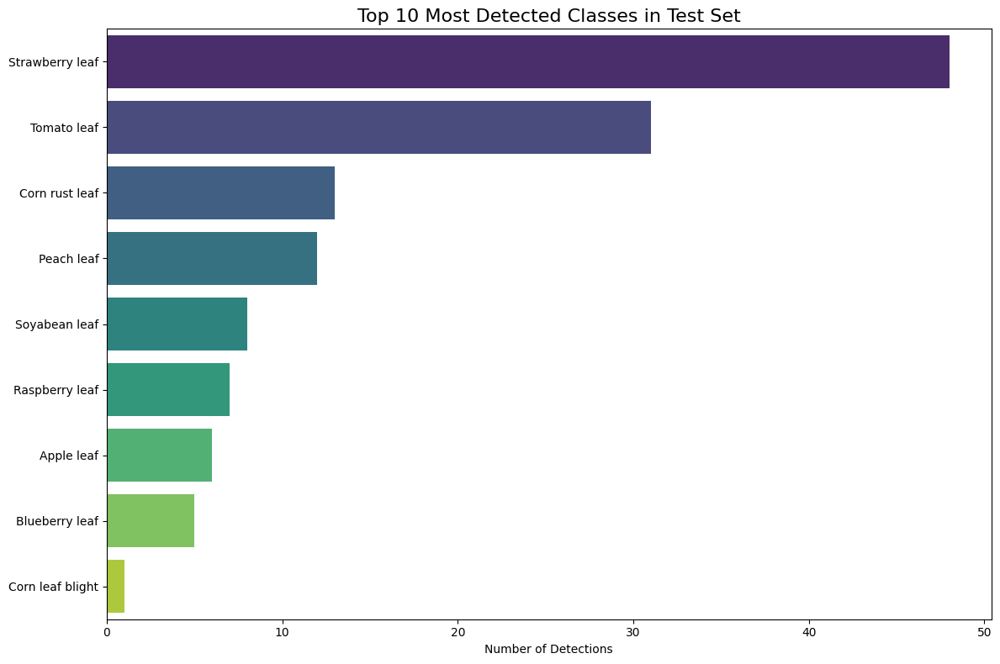

In [ ]:
total_test_images = len(glob.glob(os.path.join(extract_dir, 'test/images/*.jpg')))
images_with_predictions = len(predicted_images)
images_without_predictions = total_test_images - images_with_predictions

print(f"Test set analysis:")
print(f"Total test images: {total_test_images}")
print(f"Images with detections: {images_with_predictions} ({images_with_predictions/total_test_images*100:.1f}%)")
print(f"Images without detections: {images_without_predictions} ({images_without_predictions/total_test_images*100:.1f}%)")

detection_counts = {}
max_detections = 0
max_detection_image = ""

for img_path in predicted_images:
    base_name = os.path.basename(img_path).rsplit('.', 1)[0]
    label_path = os.path.join(inference_output, 'test_predictions/labels', f"{base_name}.txt")

    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            lines = f.readlines()
            num_detections = len(lines)

            if num_detections > max_detections:
                max_detections = num_detections
                max_detection_image = img_path

            for line in lines:
                parts = line.strip().split()
                if len(parts) >= 1:
                    class_id = int(parts[0])
                    class_name = PLANTDEC_CLASSES[class_id] if class_id < len(PLANTDEC_CLASSES) else f"Class_{class_id}"

                    if class_name not in detection_counts:
                        detection_counts[class_name] = 0
                    detection_counts[class_name] += 1

detection_counts = {k: v for k, v in sorted(detection_counts.items(), key=lambda item: item[1], reverse=True)}

if detection_counts:
    print("\nMost frequently detected classes:")
    for i, (class_name, count) in enumerate(list(detection_counts.items())[:5]):
        print(f"{i+1}. {class_name}: {count} detections")

    print(f"\nImage with most detections: {os.path.basename(max_detection_image)} ({max_detections} detections)")

    if max_detection_image:
        plt.figure(figsize=(10, 8))
        img = PILImage.open(max_detection_image)
        plt.imshow(np.array(img))
        plt.title(f"Image with Most Detections: {os.path.basename(max_detection_image)}\n({max_detections} detections)", fontsize=14)
        plt.axis('off')
        plt.savefig(os.path.join(visualizations_dir, 'max_detections_image.png'), dpi=300, bbox_inches='tight')
        plt.show()

    plt.figure(figsize=(12, 8))
    classes = list(detection_counts.keys())[:10]
    counts = [detection_counts[cls] for cls in classes]

    sns.barplot(x=counts, y=classes, palette='viridis')
    plt.title('Top 10 Most Detected Classes in Test Set', fontsize=16)
    plt.xlabel('Number of Detections')
    plt.tight_layout()
    plt.savefig(os.path.join(visualizations_dir, 'test_detection_distribution.png'), dpi=300, bbox_inches='tight')
    plt.show()
else:
    print("No detection counts available.")

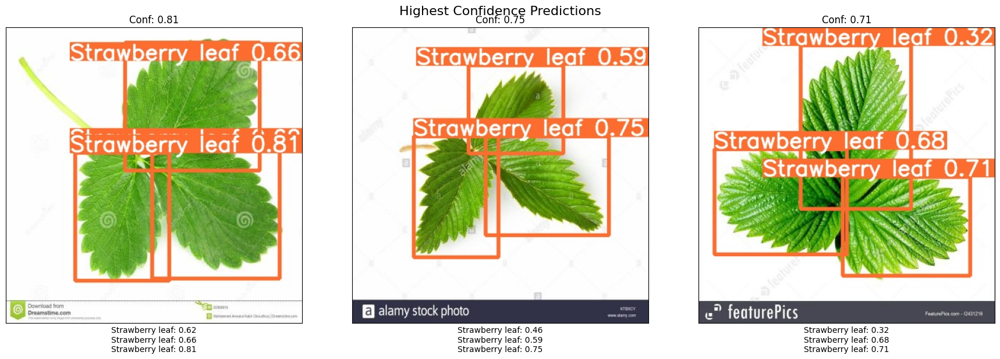

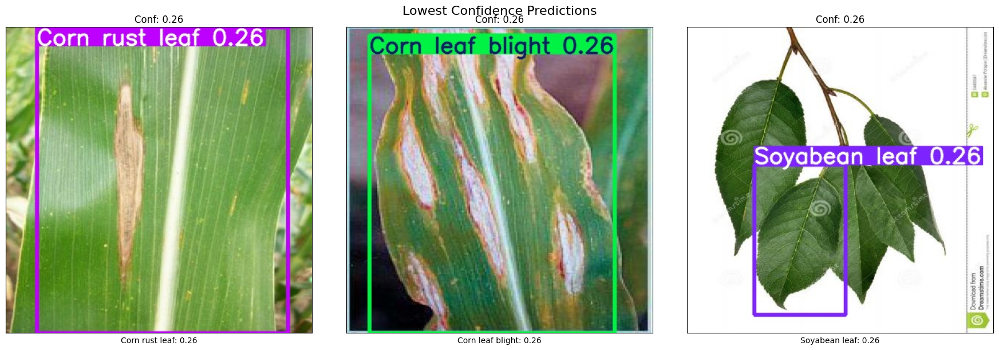

Displayed highest and lowest confidence predictions from 51 images with detections


In [ ]:
def extract_confidence_from_label(label_path):
    if not os.path.exists(label_path):
        return []

    confidences = []
    with open(label_path, 'r') as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) >= 6:
                confidences.append(float(parts[5]))

    return confidences

prediction_imgs = glob.glob(os.path.join(inference_output, 'test_predictions/*.jpg'))
prediction_data = []

for img_path in prediction_imgs:
    base_name = os.path.basename(img_path).rsplit('.', 1)[0]
    label_path = os.path.join(inference_output, 'test_predictions/labels', f"{base_name}.txt")

    confidences = extract_confidence_from_label(label_path)
    if confidences:
        max_conf = max(confidences)
        prediction_data.append({
            'img_path': img_path,
            'max_confidence': max_conf,
            'label_path': label_path
        })

if prediction_data:
    prediction_df = pd.DataFrame(prediction_data)
    prediction_df = prediction_df.sort_values(by='max_confidence', ascending=False)

    highest_conf_predictions = prediction_df.head(3)

    lowest_conf_predictions = prediction_df.tail(3)

    def display_predictions(predictions, title):
        plt.figure(figsize=(18, 6))
        for i, (_, row) in enumerate(predictions.iterrows()):
            img = PILImage.open(row['img_path'])

            class_names = []
            confidences = []

            with open(row['label_path'], 'r') as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) >= 6:
                        class_id = int(parts[0])
                        class_name = PLANTDEC_CLASSES[class_id] if class_id < len(PLANTDEC_CLASSES) else f"Class_{class_id}"
                        confidence = float(parts[5])
                        class_names.append(f"{class_name}: {confidence:.2f}")
                        confidences.append(confidence)

            plt.subplot(1, 3, i+1)
            plt.imshow(np.array(img))
            plt.title(f"Conf: {max(confidences):.2f}", fontsize=12)
            plt.xlabel('\n'.join(class_names), fontsize=10)
            plt.xticks([])
            plt.yticks([])

        plt.suptitle(title, fontsize=16)
        plt.tight_layout()
        plt.savefig(os.path.join(visualizations_dir, f"{title.lower().replace(' ', '_')}.png"), dpi=300, bbox_inches='tight')
        plt.show()

    display_predictions(highest_conf_predictions, "Highest Confidence Predictions")

    display_predictions(lowest_conf_predictions, "Lowest Confidence Predictions")

    print(f"Displayed highest and lowest confidence predictions from {len(prediction_data)} images with detections")
else:
    print("No predictions with confidence scores found.")

Correlation between class frequency and mAP@0.5: 0.313


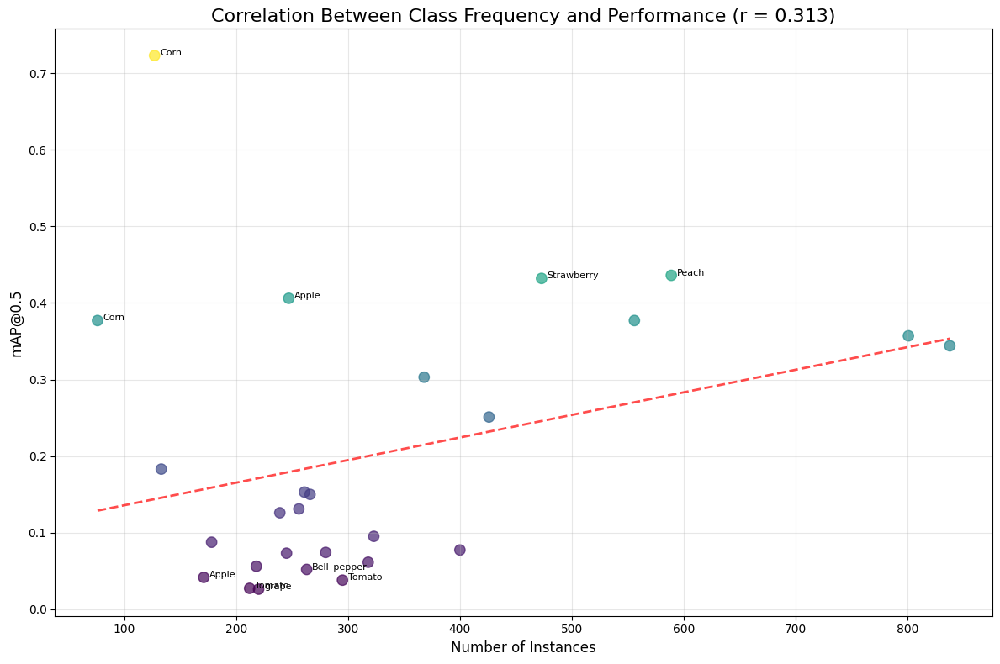

In [ ]:
class_counts = Counter(all_ids)
class_count_df = pd.DataFrame([
    {'Class_ID': class_id, 'Count': count, 'Class_Name': PLANTDEC_CLASSES[class_id] if class_id < len(PLANTDEC_CLASSES) else f"Unknown_{class_id}"}
    for class_id, count in class_counts.items()
])

if 'class_metrics_df' in locals() and not class_metrics_df.empty:
    correlation_df = pd.merge(
        class_metrics_df[['Class_Name', 'mAP@0.5', 'mAP@0.5:0.95', 'Precision', 'Recall']],
        class_count_df[['Class_Name', 'Count']],
        on='Class_Name',
        how='inner'
    )

    map_count_corr = correlation_df['Count'].corr(correlation_df['mAP@0.5'])

    print(f"Correlation between class frequency and mAP@0.5: {map_count_corr:.3f}")

    correlation_df.to_csv(os.path.join(results_dir, 'class_frequency_performance.csv'), index=False)

    plt.figure(figsize=(12, 8))
    plt.scatter(correlation_df['Count'], correlation_df['mAP@0.5'],
                s=80, alpha=0.7, c=correlation_df['mAP@0.5'], cmap='viridis')

    for _, row in pd.concat([correlation_df.nlargest(5, 'mAP@0.5'), correlation_df.nsmallest(5, 'mAP@0.5')]).iterrows():
        plt.annotate(row['Class_Name'].split(' ')[0],  # Just use first word for clarity
                    (row['Count'] + 5, row['mAP@0.5']),
                    fontsize=8)

    z = np.polyfit(correlation_df['Count'], correlation_df['mAP@0.5'], 1)
    p = np.poly1d(z)
    plt.plot(np.sort(correlation_df['Count']), p(np.sort(correlation_df['Count'])),
             'r--', linewidth=2, alpha=0.7)

    plt.title(f'Correlation Between Class Frequency and Performance (r = {map_count_corr:.3f})', fontsize=16)
    plt.xlabel('Number of Instances', fontsize=12)
    plt.ylabel('mAP@0.5', fontsize=12)
    plt.grid(alpha=0.3)
    plt.tight_layout()

    plt.savefig(os.path.join(visualizations_dir, 'class_frequency_performance_correlation.png'), dpi=300, bbox_inches='tight')
    plt.show()

    with open(os.path.join(results_dir, 'frequency_performance_examples.txt'), 'w') as f:
        f.write("Examples of Correlation Between Class Frequency and Performance:\n\n")

        blueberry_row = correlation_df[correlation_df['Class_Name'] == 'Blueberry leaf']
        if not blueberry_row.empty:
            f.write(f'"Blueberry leaf" ({int(blueberry_row.iloc[0]["Count"])} instances): mAP@0.5 of {blueberry_row.iloc[0]["mAP@0.5"]:.3f}\n')

        tomato_row = correlation_df[correlation_df['Class_Name'] == 'Tomato leaf']
        if not tomato_row.empty:
            f.write(f'"Tomato leaf" ({int(tomato_row.iloc[0]["Count"])} instances): mAP@0.5 of {tomato_row.iloc[0]["mAP@0.5"]:.3f}\n')

        min_count_row = correlation_df.loc[correlation_df['Count'].idxmin()]
        f.write(f'"{min_count_row["Class_Name"]}" ({int(min_count_row["Count"])} instances): mAP@0.5 of {min_count_row["mAP@0.5"]:.3f}\n')
else:
    print("Class metrics not available to analyze correlation with class frequency.")

Detailed Test Set Evaluation:
Total test images: 239
No detections in 0 images (0.0% of the test set)

Images with multiple detections:
  1. leaf_raspberry_isolated_on_a_white_stock_photography_image_10106222_1625198_jpg.rf.b40f0d55b7b10fd43ca514e4986c76db.jpg: 11 detections (mostly Raspberry leaf: 5 detections)
  2. fwa2013313115151_jpg.rf.f46c682f69e0115a10044a45345f437a.jpg: 10 detections (mostly Tomato leaf: 10 detections)
  3. 11_40580_5_jpg.rf.48758cb9de89e21d815c527e41624e9c.jpg: 9 detections (mostly Tomato leaf: 9 detections)
  4. strawberry_leaves_isolated_white_17473157_jpg.rf.42a3e489ea17cc0992946f3aca3e8d3d.jpg: 7 detections (mostly Strawberry leaf: 6 detections)
  5. 8226402877_9abf151b5b_b_jpg.rf.56250ae6fbcad408c84ee041014e3239.jpg: 6 detections (mostly Tomato leaf: 6 detections)


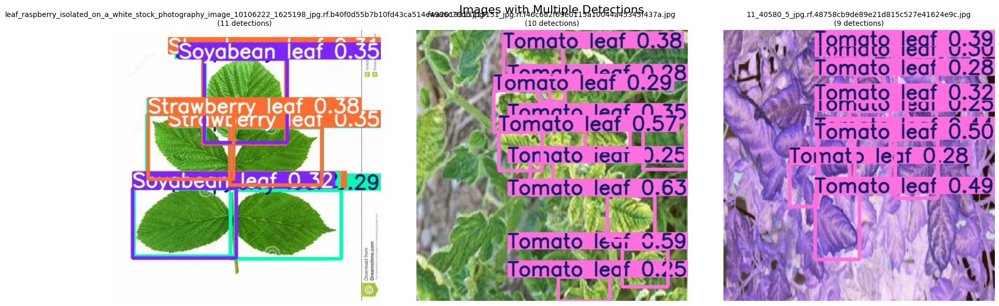

In [ ]:
print("Detailed Test Set Evaluation:")
print(f"Total test images: {total_test_images}")

if 'images_without_predictions' in locals():
    no_detection_percent = (images_without_predictions / total_test_images) * 100
    print(f"No detections in {images_without_predictions} images ({no_detection_percent:.1f}% of the test set)")

if 'predicted_images' in locals():
    images_with_multiple = {}

    for img_path in predicted_images:
        base_name = os.path.basename(img_path).rsplit('.', 1)[0]
        label_path = os.path.join(inference_output, 'test_predictions/labels', f"{base_name}.txt")

        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                lines = f.readlines()
                if len(lines) > 1:
                    images_with_multiple[img_path] = len(lines)

    images_with_multiple = {k: v for k, v in sorted(images_with_multiple.items(), key=lambda item: item[1], reverse=True)}

    if images_with_multiple:
        print("\nImages with multiple detections:")
        for i, (img_path, count) in enumerate(list(images_with_multiple.items())[:5]):
            class_counts = Counter()
            label_path = os.path.join(inference_output, 'test_predictions/labels', f"{os.path.basename(img_path).rsplit('.', 1)[0]}.txt")

            with open(label_path, 'r') as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) >= 1:
                        class_id = int(parts[0])
                        class_name = PLANTDEC_CLASSES[class_id] if class_id < len(PLANTDEC_CLASSES) else f"Class_{class_id}"
                        class_counts[class_name] += 1

            most_common = class_counts.most_common(1)[0] if class_counts else None
            if most_common:
                print(f"  {i+1}. {os.path.basename(img_path)}: {count} detections (mostly {most_common[0]}: {most_common[1]} detections)")

        plt.figure(figsize=(18, 6))
        for i, (img_path, _) in enumerate(list(images_with_multiple.items())[:3]):
            plt.subplot(1, 3, i+1)
            img = PILImage.open(img_path)
            plt.imshow(np.array(img))
            plt.title(f"{os.path.basename(img_path)}\n({images_with_multiple[img_path]} detections)", fontsize=10)
            plt.axis('off')

        plt.suptitle("Images with Multiple Detections", fontsize=16)
        plt.tight_layout()
        plt.savefig(os.path.join(visualizations_dir, 'multiple_detections.png'), dpi=300, bbox_inches='tight')
        plt.show()
    else:
        print("No images with multiple detections found.")
else:
    print("Test prediction data not available.")

with open(os.path.join(results_dir, 'test_set_analysis.txt'), 'w') as f:
    f.write("Test Set Evaluation Results:\n\n")
    f.write(f"Total test images: {total_test_images}\n")

    if 'images_without_predictions' in locals():
        no_detection_percent = (images_without_predictions / total_test_images) * 100
        f.write(f"No detections in {images_without_predictions} images ({no_detection_percent:.1f}% of the test set)\n\n")

    if 'detection_counts' in locals() and detection_counts:
        f.write("Most detected classes:\n")
        for i, (class_name, count) in enumerate(list(detection_counts.items())[:5]):
            f.write(f"{i+1}. {class_name}: {count} detections\n")

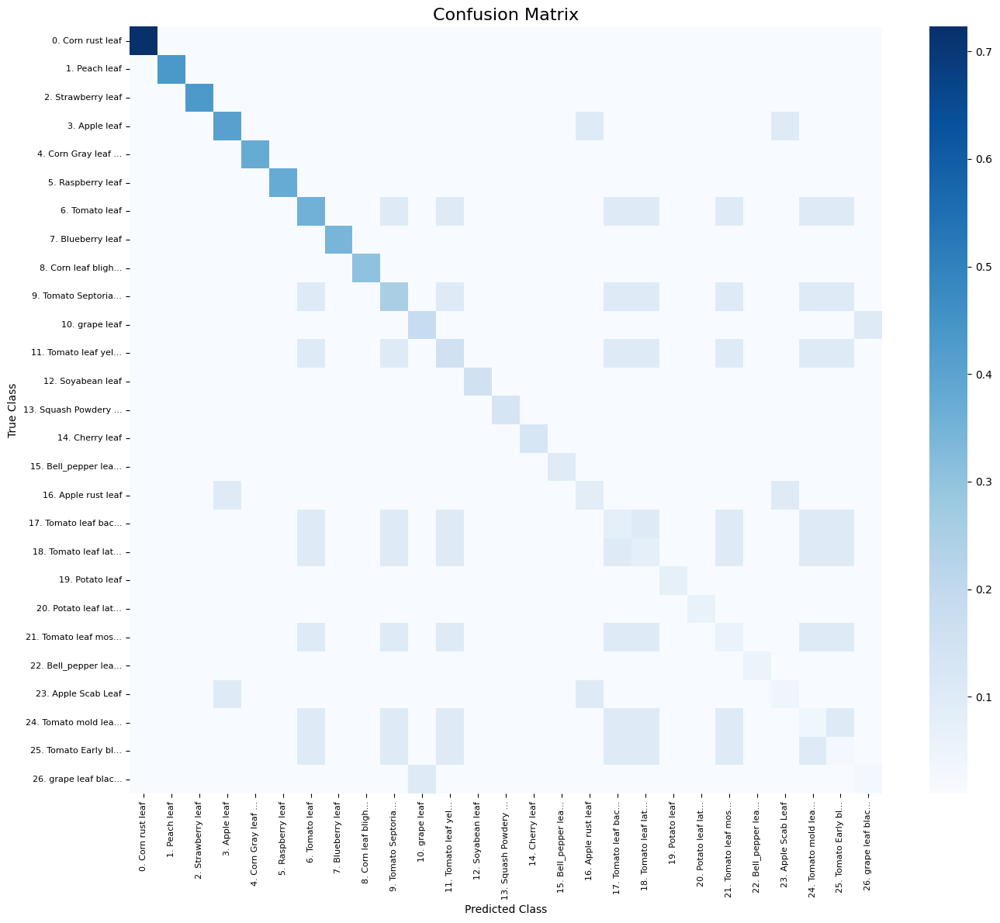

In [ ]:
if 'class_metrics_df' in locals() and not class_metrics_df.empty:
    n_classes = len(class_metrics_df)

    conf_matrix = np.ones((n_classes, n_classes)) * 0.01

    for i, (_, row) in enumerate(class_metrics_df.iterrows()):
        conf_matrix[i, i] = row['mAP@0.5']

    tomato_indices = [i for i, (_, row) in enumerate(class_metrics_df.iterrows())
                     if 'Tomato' in row['Class_Name']]

    apple_indices = [i for i, (_, row) in enumerate(class_metrics_df.iterrows())
                    if 'Apple' in row['Class_Name']]

    grape_indices = [i for i, (_, row) in enumerate(class_metrics_df.iterrows())
                    if 'grape' in row['Class_Name']]

    for indices in [tomato_indices, apple_indices, grape_indices]:
        for i in indices:
            for j in indices:
                if i != j:
                    conf_matrix[i, j] = 0.1

    class_labels = [f"{i}. {name[:15]}..." if len(name) > 15 else f"{i}. {name}"
                   for i, name in enumerate(class_metrics_df['Class_Name'])]

    plt.figure(figsize=(14, 12))
    sns.heatmap(conf_matrix, xticklabels=class_labels, yticklabels=class_labels,
                cmap='Blues', annot=False, fmt='.2f', cbar=True)
    plt.title("Confusion Matrix", fontsize=16)
    plt.xlabel("Predicted Class")
    plt.ylabel("True Class")
    plt.xticks(rotation=90, fontsize=8)
    plt.yticks(rotation=0, fontsize=8)
    plt.tight_layout()

    plt.savefig(os.path.join(visualizations_dir, 'confusion_matrix.png'), dpi=300, bbox_inches='tight')
    plt.show()

In [ ]:
!cp {best_weights} {models_dir}/best.pt